In [1]:
from sectional_v2.util.Nd.sizedist_class_v2.SizedistributionBins import SizedistributionStationBins
from sectional_v2.util.Nd.sizedist_class_v2.SizedistributionStation import SizedistributionStation
from sectional_v2.util.collocate.collocateLONLAToutput import CollocateLONLATout
from sectional_v2.constants import sized_varListNorESM, list_sized_vars_noresm, list_sized_vars_nonsec
#from useful_scit.util import log
import useful_scit.util.log as log
import time
log.ger.setLevel(log.log.INFO)

/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME/
/home/ubuntu/mnts/nird/projects/SECTIONAL_v2/sectional_v2/data_info/area_defs.csv


In [2]:
nr_of_bins = 5
maxDiameter = 39.6  #    23.6 #e-9
minDiameter = 5.0  # e-9
history_field='.h1.'
variables = sized_varListNorESM['NCONC'] + sized_varListNorESM['NMR'] + sized_varListNorESM['SIGMA']
cases_sec = []#'SECTv11_ctrl']
cases_orig =[]#'noSECTv11_ctrl'] #/noSECTv11_ctrl
cases_sec = ['SECTv21_ctrl', 'SECTv21_ctrl_koagD']#'SECTv11_ctrl_fbvoc']#'SECTv11_ctrl']#,'SECTv11_ctrl_fbvoc']#'SECTv11_ctrl']
cases_orig =['noSECTv21_default_dd','noSECTv21_ox_ricc_dd']#'noSECTv11_ctrl_fbvoc'] #/no SECTv11_ctrl

from_t = '2008-01-01'
to_t = '2009-01-01'

## Collocate NCONC\*, NMR\* and SIGMA\*

In [3]:
varl_s=['dNdlogD_mod','dNdlogD_mode01', 'dNdlogD_sec', 'NMR01','NCONC01']#,'SO4_NAcondTend', 'SOA_NAcondTend']
varl_o=['dNdlogD_mod','dNdlogD_mode01', 'NMR01','NCONC01']#,'SO4_NAcondTend', 'SOA_NAcondTend']
dic_sd={}
for case_name in cases_sec:
    varlist =varl_s
    c = CollocateLONLATout(case_name, from_t, to_t,
                           True,
                           'hour',
                           history_field=history_field)
    a =c.get_station_ds(varlist)
    dic_sd[case_name]=a.isel(lev=-1)
    print(case_name)
    #if c.check_if_load_raw_necessary(varlist ):
    #    a = c.make_station_data_all()
for case_name in cases_orig:
    print(case_name)
    varlist =varl_o
    c = CollocateLONLATout(case_name, from_t, to_t,
                           False,
                           'hour',
                           history_field=history_field)
    a =c.get_station_ds(varlist)
    dic_sd[case_name]=a.isel(lev=-1)

    


/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl/dNdlogD_mod_SECTv21_ctrl_2008-01-01_2009-01-01_hour_locations.nc
/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl/dNdlogD_mode01_SECTv21_ctrl_2008-01-01_2009-01-01_hour_locations.nc
/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl/dNdlogD_sec_SECTv21_ctrl_2008-01-01_2009-01-01_hour_locations.nc
/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl/NMR01_SECTv21_ctrl_2008-01-01_2009-01-01_hour_locations.nc
/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl/NCONC01_SECTv21_ctrl_2008-01-01_2009-01-01_hour_locations.nc
SECTv21_ctrl
/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//collocated_ds//NorESM/SECTv21_ctrl_koagD/dNdlogD_mod_SECTv21_ctrl_koagD_2008-01-01_2009-01-01_hour_locations.nc
/hom

## EBAS data:

In [4]:
from sectional_v2.util.EBAS_data.sizedistrib import create_EBAS_sizedist, raw_data_EBAS

In [5]:
fn = raw_data_EBAS / 'FI0050R.20080101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1y.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

#fn = raw_data_EBAS / 'FI0050R.20100101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1h.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

In [6]:
eb = create_EBAS_sizedist(fn)

/home/ubuntu/mnts/nird/projects/EBAS_data/reform_data


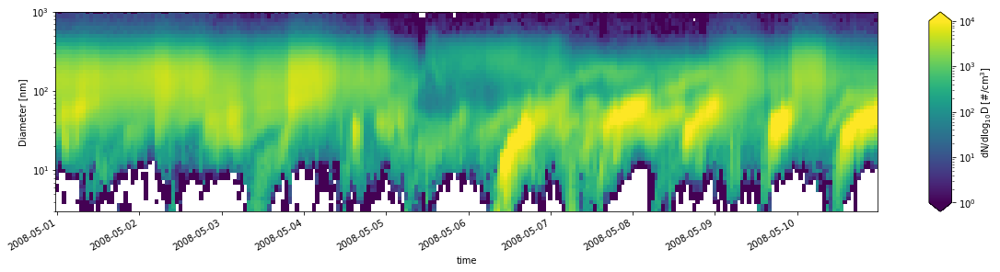

In [7]:
eb.plot_time_from_to(from_time='2008-05-01', to_time='2008-05-10')

$ \frac{dN}{dlogD} = \frac{dN}{dlog_{10}D}\cdot \frac{dlog_{10}D}{dlogD}$

$10^{x} = e^{log(10)x}$

$10^{log_{10}D} = D$

$e^{log(10)\cdot log_{10}D} = D$

$ln(D) = log(10)\cdot log_{10}D$

$ \frac{dN}{dlogD} = \frac{dN}{dlog_{10}D}\cdot \frac{dlog_{10}D}{dlogD}= \frac{dN}{dlog_{10}D} \cdot \frac{1}{log(10)}$


$ \frac{dN}{dlog_{10}D} = \frac{dN}{dlogD} \cdot log(10)$


In [6]:
import numpy as np

In [7]:
np.log(10)

2.302585092994046

In [8]:
_from_time='2008-05-01' 
_to_time='2008-05-10'

In [22]:
for case in cases_sec:
    print(case)
    _ds = dic_sd[case].sel(time=slice(_from_time,_to_time)) # ['dNdlogD']
    _ds['dNdlogD'] = _ds['dNdlogD_mod'] + _ds['dNdlogD_sec']
    _ds['dNdlog10D'] =_ds['dNdlogD']*np.log(10)
    dic_sd[case] = _ds
for case in cases_orig:
    print(case)
    
    #_ds = dic_sd[case] # ['dNdlogD']
    _ds = dic_sd[case].sel(time=slice(_from_time,_to_time)) # ['dNdlogD']
    _ds['dNdlogD'] = _ds['dNdlogD_mod']# + _ds['dNdlogD_sec']
    _ds['dNdlog10D'] =_ds['dNdlogD']*np.log(10)
    dic_sd[case] = _ds
    

SECTv21_ctrl
SECTv21_ctrl_koagD
noSECTv21_default_dd
noSECTv21_ox_ricc_dd


## Hyytiala

In [23]:
station='SMR'
figsize = [10,10]

In [24]:
fn = raw_data_EBAS / 'FI0050R.20080101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1y.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

#fn = raw_data_EBAS / 'FI0050R.20100101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1h.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

In [25]:
eb = create_EBAS_sizedist(fn)

/home/ubuntu/mnts/nird/projects/EBAS_data/reform_data


In [26]:
import matplotlib.pyplot as plt

In [27]:
from sectional_v2.data_info import get_nice_name_case

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


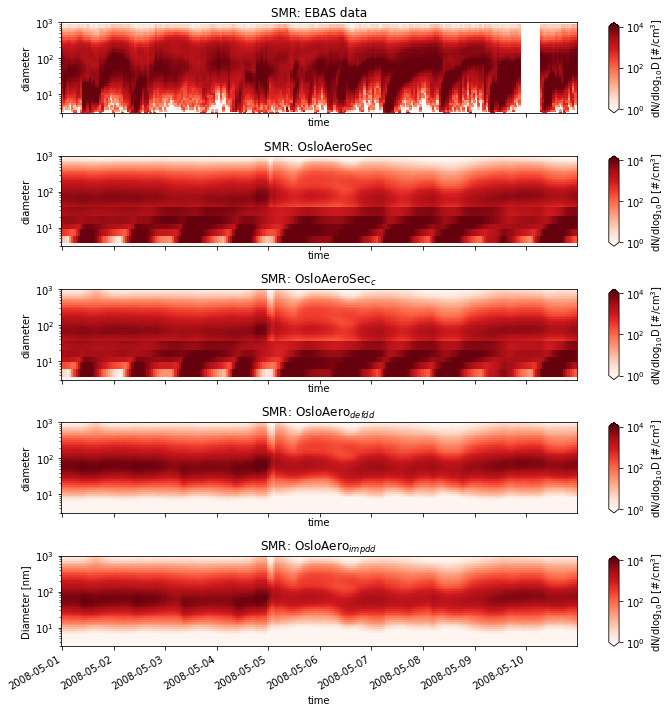

In [32]:
def plt_all_cases_time_sized(eb,_from_time, _to_time,station,  axs=None, figsize=[10,10]):
    if axs is None:
        fig, axs = plt.subplots(5, figsize=figsize, sharex=True, sharey=True)
    eb.plot_time_from_to(from_time=_from_time, to_time=_to_time,cmap='Reds', ax=axs[0])
    axs = axs.flatten()
    axs[0].set_title(f'{station}: EBAS data')
    for case,ax in zip(cases_sec+cases_orig, axs[1:]):
        _ds = dic_sd[case]
        eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station=station), cmap='Reds', ax=ax)
        ax.set_title(f'{station}: {get_nice_name_case(case)}')
      
plt_all_cases_time_sized(eb, _from_time, _to_time, 'SMR')
plt.tight_layout()

## Melpiz

In [33]:
from sectional_v2.util.EBAS_data.sizedistrib import create_EBAS_sizedist, raw_data_EBAS

In [34]:
fn = raw_data_EBAS / 'DE0044R.20080101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1y.1h.DE08L_DMPS_IFT_MELPITZ02_until_20080818_.DE08L_IFT_DRY_TDMPS_until_20080818_DE08L_IFT_C.lev2.nc'

#fn = raw_data_EBAS / 'FI0050R.20100101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1h.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

In [35]:
eb = create_EBAS_sizedist(fn, place='MPZ', perc=False)

/home/ubuntu/mnts/nird/projects/EBAS_data/reform_data


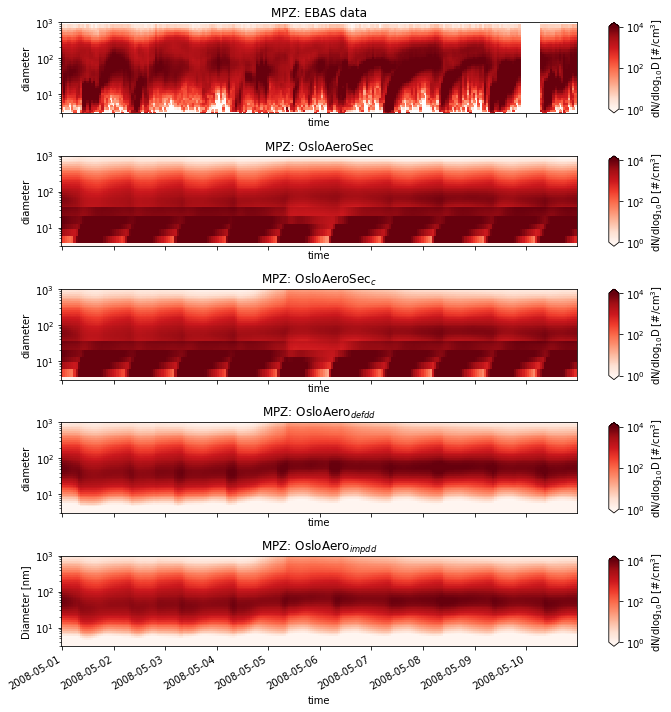

In [36]:
plt_all_cases_time_sized(eb, _from_time, _to_time, 'MPZ')
plt.tight_layout()

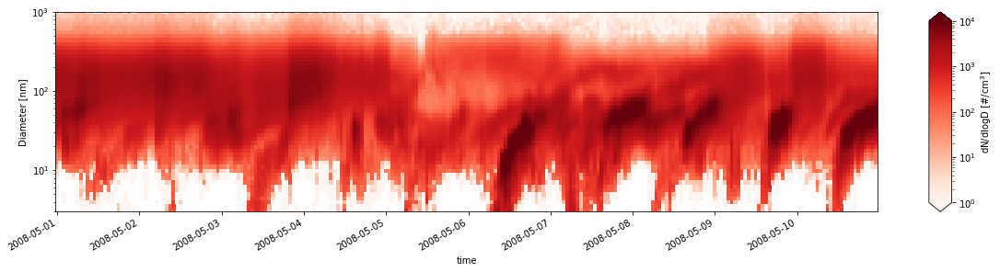

In [12]:
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time,cmap='Reds')

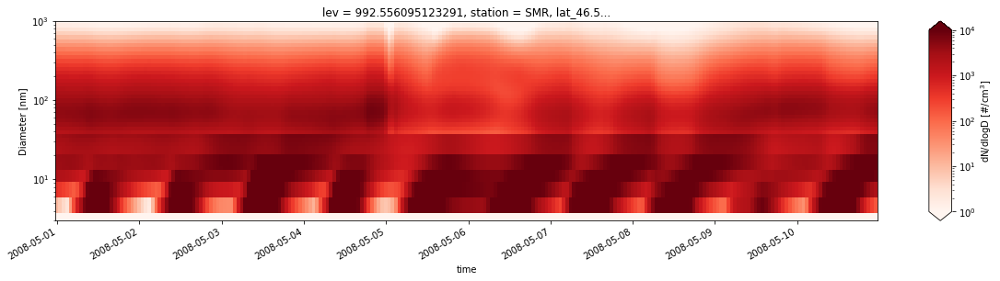

In [14]:
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='SMR'), cmap='Reds')

In [15]:
_ds = dic_sd['noSECTv21_default_dd']#['dNdlogD']
_ds['dNdlogD'] = _ds['dNdlogD_mod'] #+ _ds['dNdlogD_sec']
_ds['dNdlog10D'] =_ds['dNdlogD']*np.log(10)

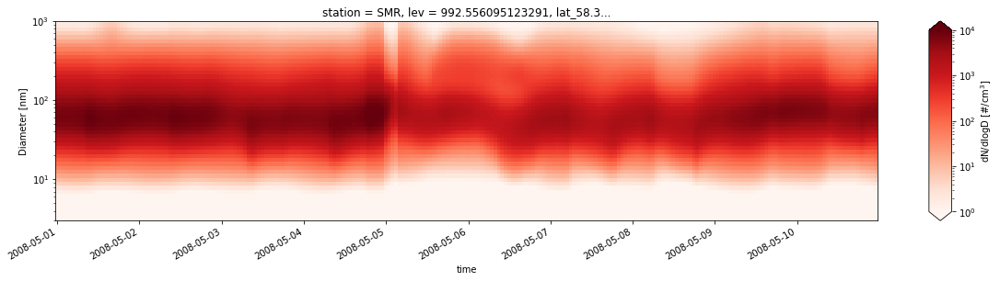

In [16]:
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='SMR'), cmap='Reds')

In [17]:
_ds = dic_sd['noSECTv21_ox_ricc_dd']#['dNdlogD']
_ds['dNdlogD'] = _ds['dNdlogD_mod'] #+ _ds['dNdlogD_sec']
_ds['dNdlog10D'] =_ds['dNdlogD']*np.log(10)

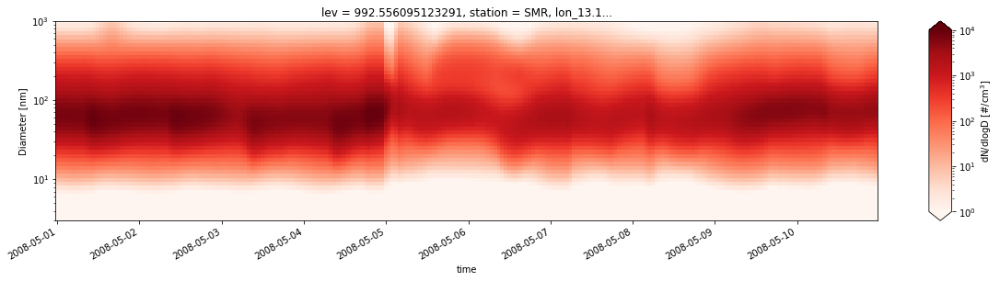

In [18]:
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='SMR'), cmap='Reds')

In [39]:
from sectional_v2.util.EBAS_data.sizedistrib import create_EBAS_sizedist, raw_data_EBAS

In [20]:
fn = raw_data_EBAS / 'DE0044R.20080101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1y.1h.DE08L_DMPS_IFT_MELPITZ02_until_20080818_.DE08L_IFT_DRY_TDMPS_until_20080818_DE08L_IFT_C.lev2.nc'

#fn = raw_data_EBAS / 'FI0050R.20100101000000.20181205100800.dmps.particle_number_size_distribution.aerosol.1h.1h.FI03L_DMPS_HYY_01.FI03L_TRY_TDMPS.lev2.nc'

In [21]:
import xarray as xr

In [22]:
eb = create_EBAS_sizedist(fn, place='MPZ', perc=False)

/home/ubuntu/mnts/nird/projects/EBAS_data/reform_data


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


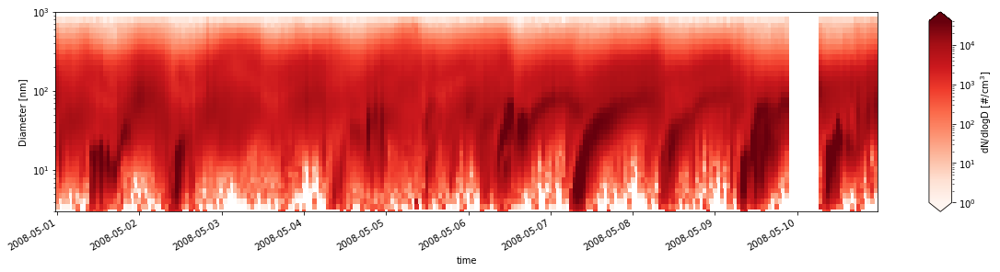

In [23]:
_from_time='2008-05-01' 
_to_time='2008-05-10'
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, vmax=4e4, cmap='Reds')

In [40]:
from matplotlib.colors import LogNorm
norm = LogNorm(vmin=100, vmax=4e4)

In [42]:
from_time= '2008-06-01'
to_time = '2008-09-01'

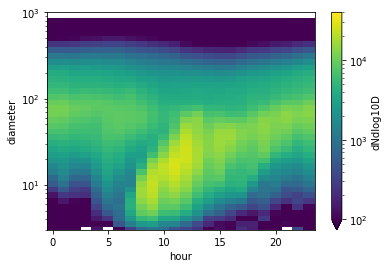

In [44]:
eb.dataset['dNdlog10D'].sel(time=slice(_from_time, _to_time)).groupby('time.hour').mean().plot(yscale='log', ylim=[3,1e3], norm=norm)#, cmap='Reds')

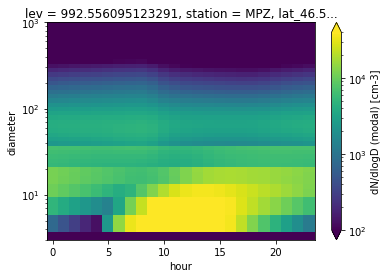

In [45]:
_ds = dic_sd['SECTv21_ctrl']#['dNdlogD']
_ds['dNdlog10D'].sel(time=slice(_from_time, _to_time)).sel(station='MPZ').groupby('time.hour').mean().plot(y='diameter',yscale='log', ylim=[3,1e3], norm=norm)

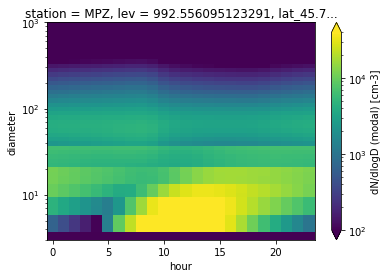

In [43]:
_ds = dic_sd['SECTv21_ctrl_koagD']#['dNdlogD']
_ds['dNdlog10D'].sel(time=slice(_from_time, _to_time)).sel(station='MPZ').groupby('time.hour').mean().plot(y='diameter',yscale='log', ylim=[3,1e3], norm=norm)

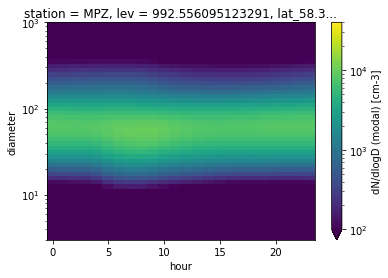

In [72]:
_ds = dic_sd['noSECTv21_default_dd']#['dNdlogD']
_ds['dNdlog10D'].sel(time=slice(from_time, to_time)).sel(station='MPZ').groupby('time.hour').mean().plot(y='diameter',yscale='log', ylim=[3,1e3], norm=norm)

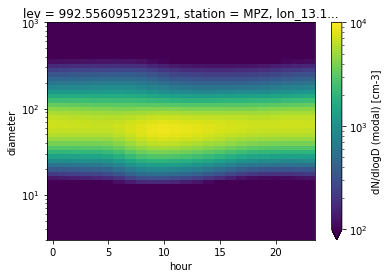

In [68]:
_ds = dic_sd['noSECTv21_ox_ricc_dd']#['dNdlogD']
_ds['dNdlog10D'].sel(time=slice(from_time, to_time)).sel(station='MPZ').groupby('time.hour').mean().plot(y='diameter',yscale='log', ylim=[3,1e3], norm=norm)

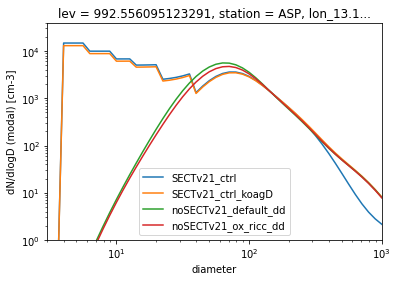

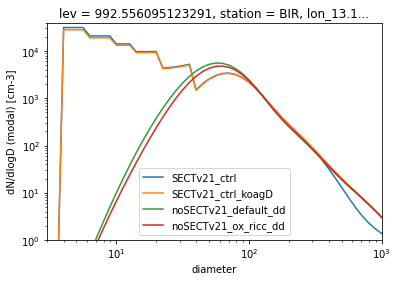

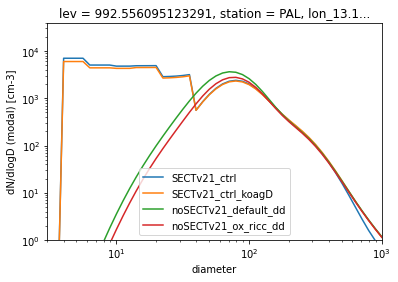

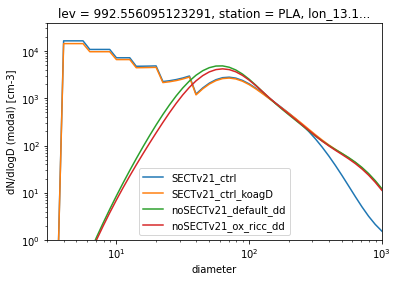

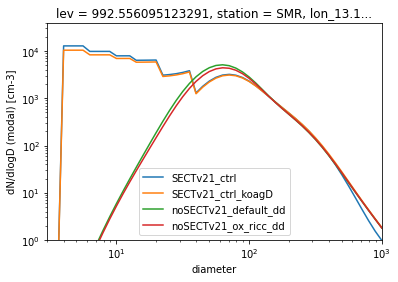

...

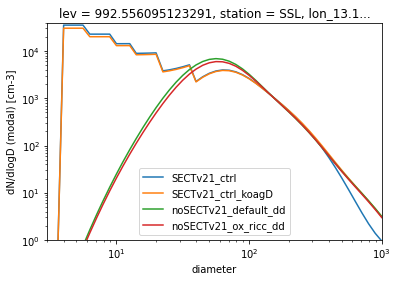

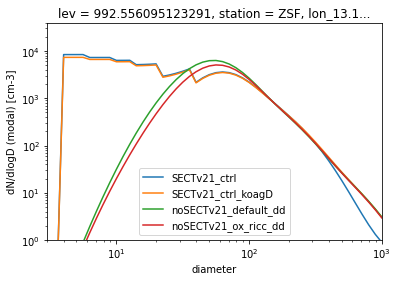

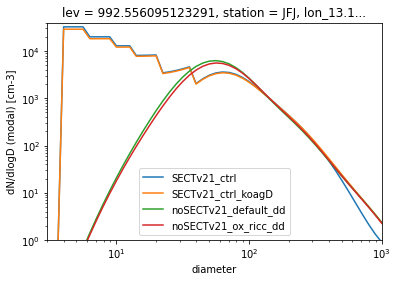

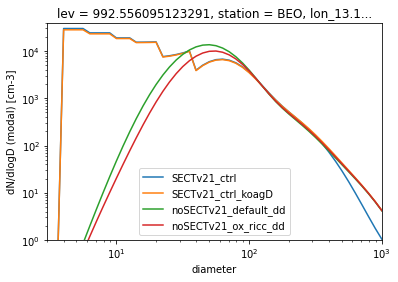

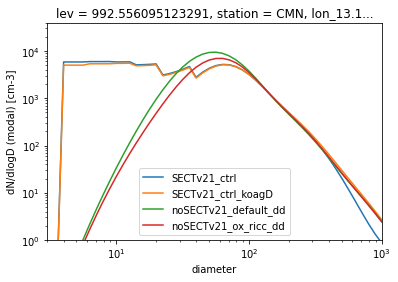

In [53]:
for stat in _ds['station'].values:
    for case in cases_sec +cases_orig:
        _ds = dic_sd[case]#['dNdlogD']
        _ds['dNdlog10D'].sel(station=stat).mean(['time']).plot(x='diameter',xscale='log', xlim=[3,1e3],label=case, yscale='log',ylim=[1,4e4])#, norm=norm)
    plt.legend()
    plt.show()

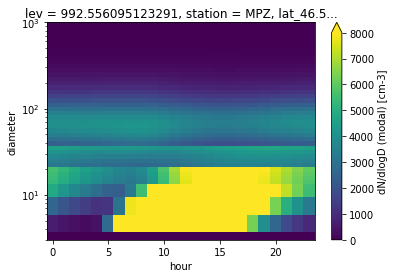

In [73]:
_ds = dic_sd['SECTv21_ctrl']#['dNdlogD']
_ds['dNdlog10D'].groupby('time.hour').mean().sel(station='MPZ').plot(y='diameter',yscale='log', vmax=8000, ylim=[3,1e3])

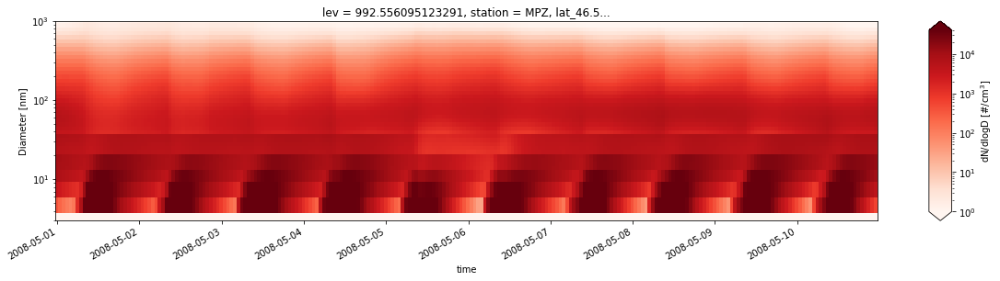

In [25]:
_ds = dic_sd['SECTv21_ctrl']#['dNdlogD']
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='MPZ'), vmax=4e4, cmap='Reds')

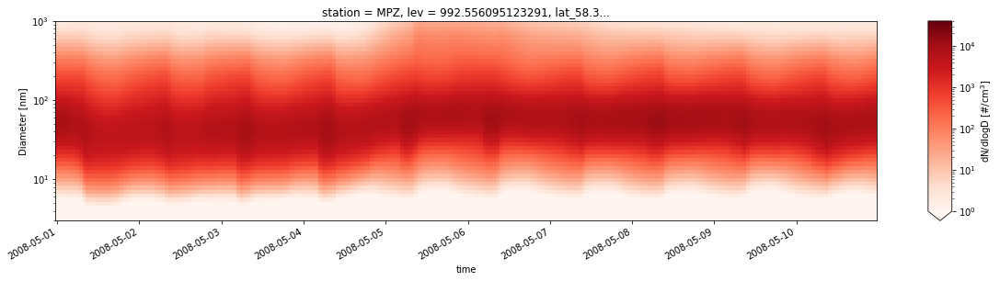

In [26]:
_ds = dic_sd['noSECTv21_default_dd']#['dNdlogD']
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='MPZ'), vmax=4e4, cmap='Reds')

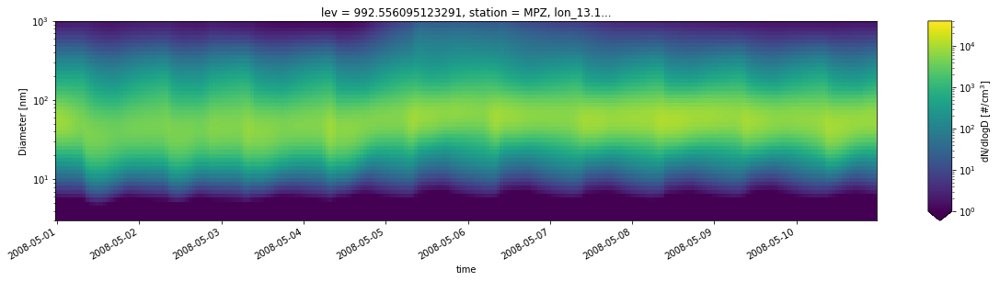

In [28]:
_ds = dic_sd['noSECTv21_ox_ricc_dd']#['dNdlogD']
eb.plot_time_from_to(from_time=_from_time, to_time=_to_time, dataset=_ds.sel(station='MPZ'), vmax=4e4)

In [15]:
import numpy as np
from useful_scit.imps import (np, plt, pd)

In [12]:
stations = dic_sd[cases_sec[0]]['station'].values

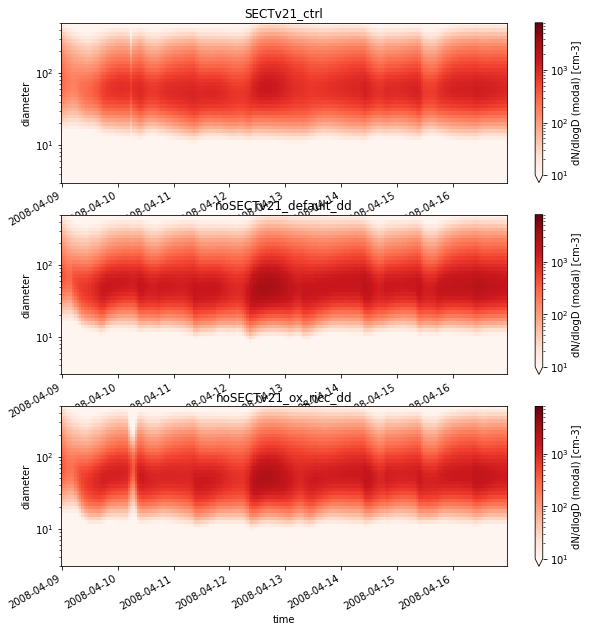

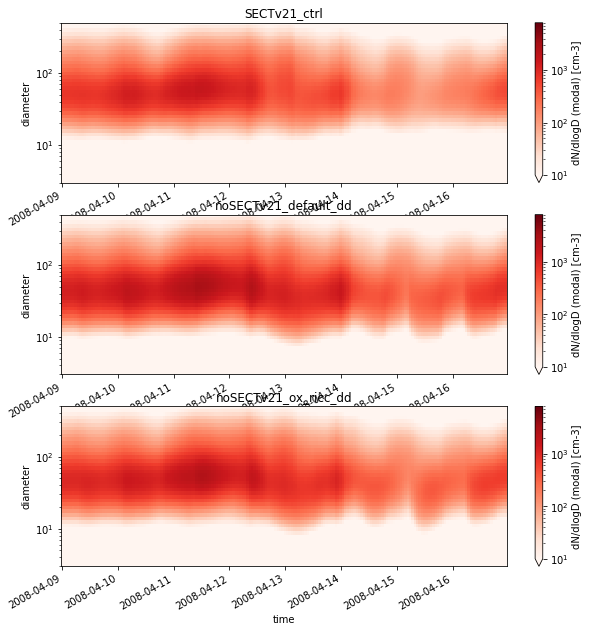

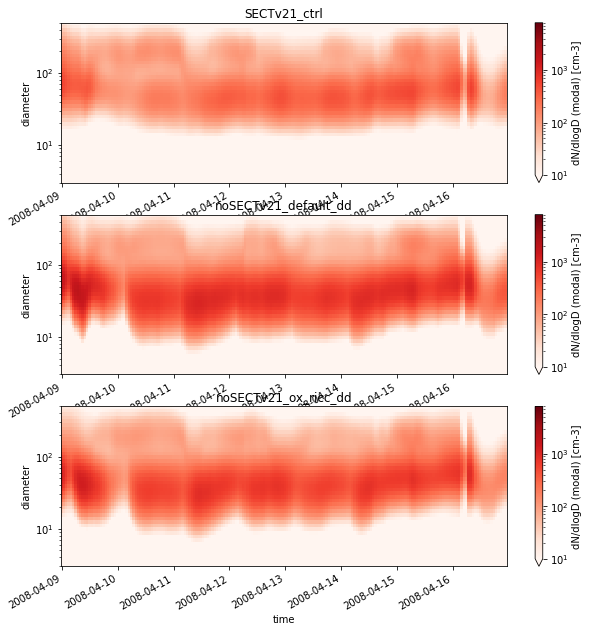

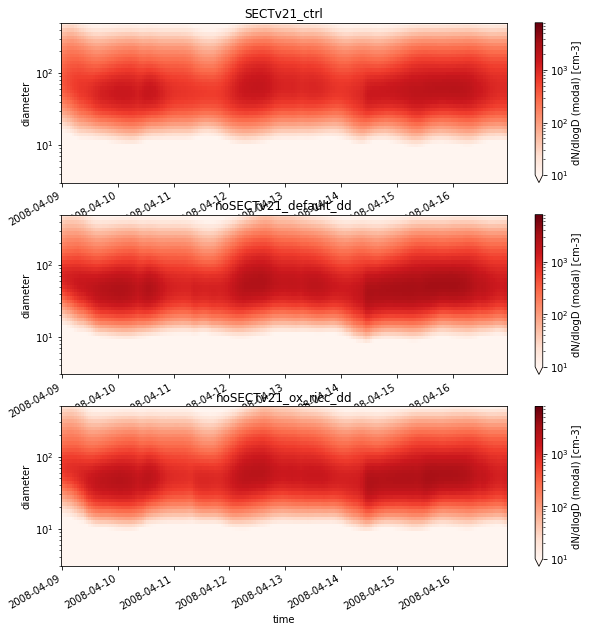

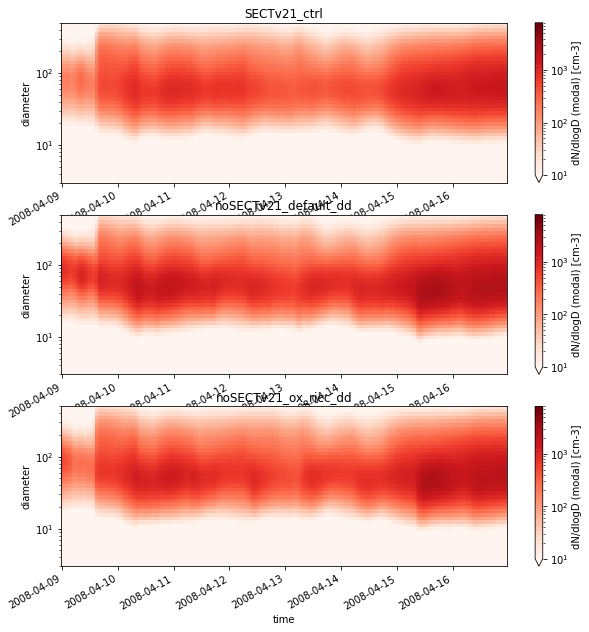

...

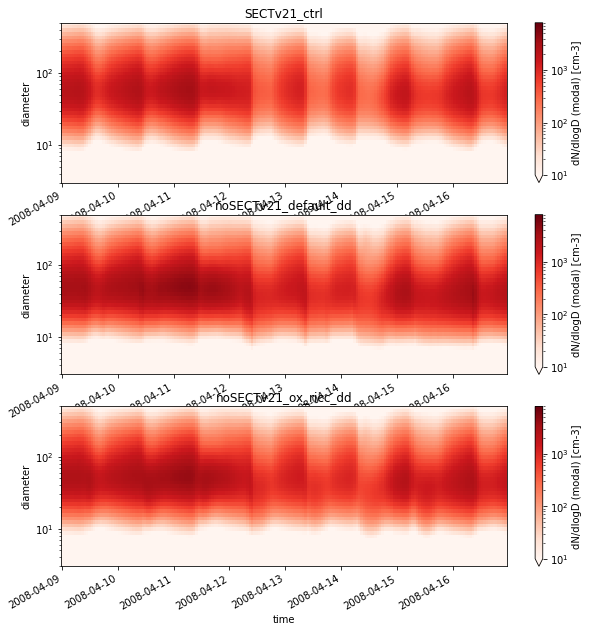

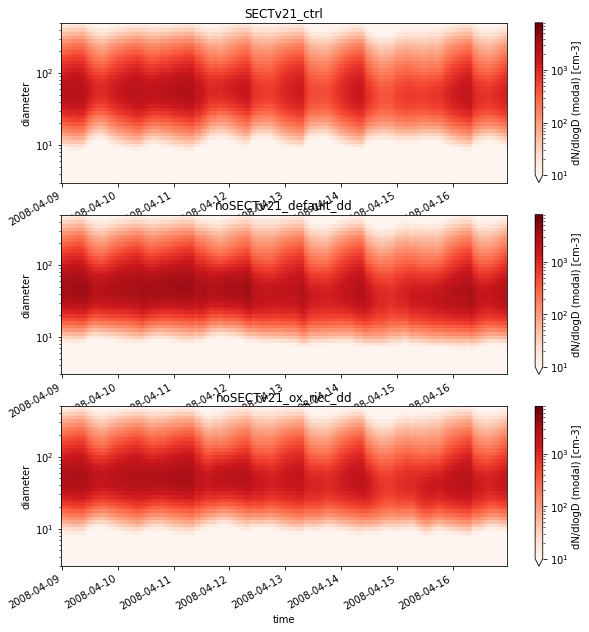

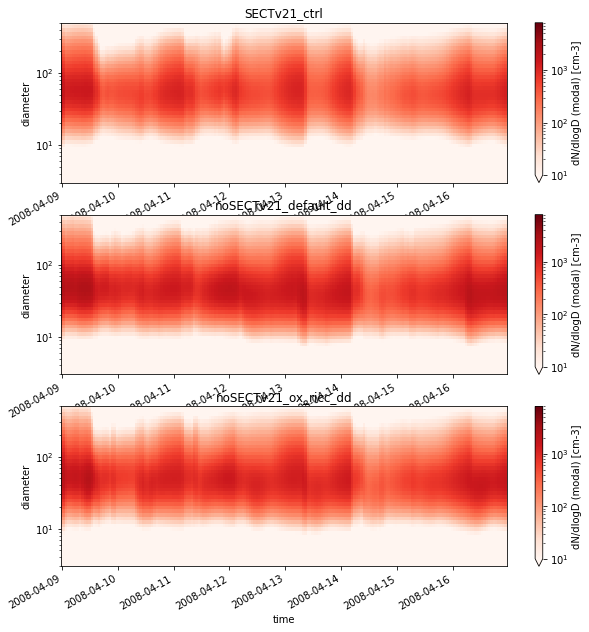

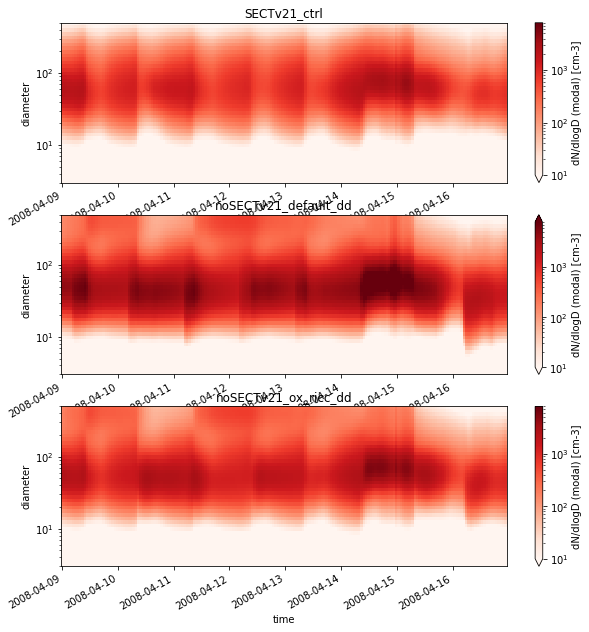

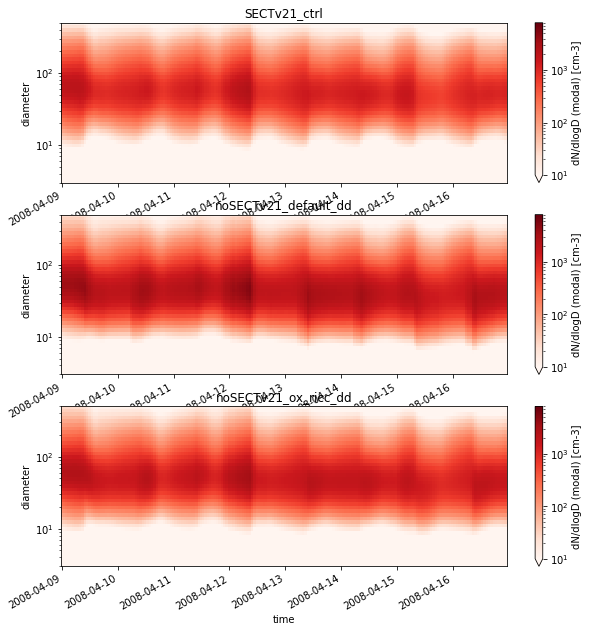

In [13]:
import matplotlib.colors as mcolors
st = '2008-04-09'
et = '2008-04-16'
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(3, figsize=[10,10])
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod'] #+ plt_ds['dNdlogD_sec']
        plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(case_name)
    for case_name, ax in zip(cases_orig, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod']# + plt_ds['dNdlogD_sec']
        plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(case_name)
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

        
    plt.show()

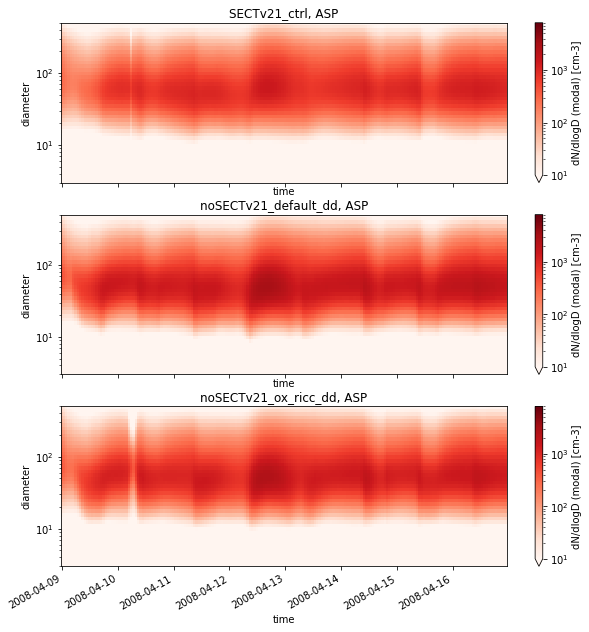

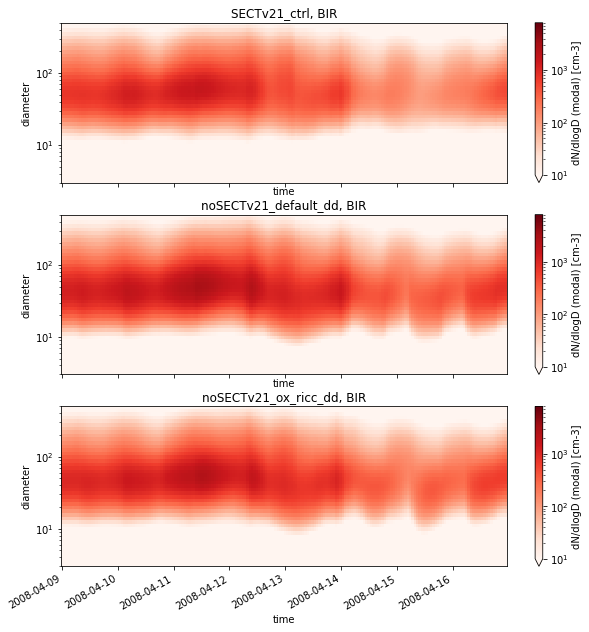

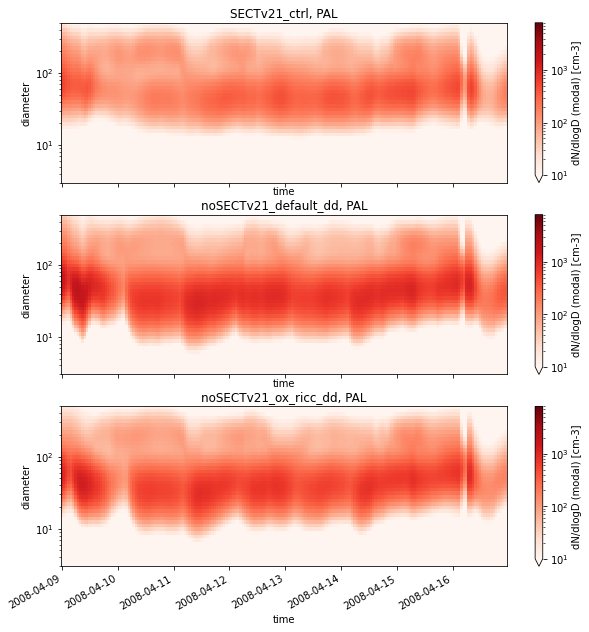

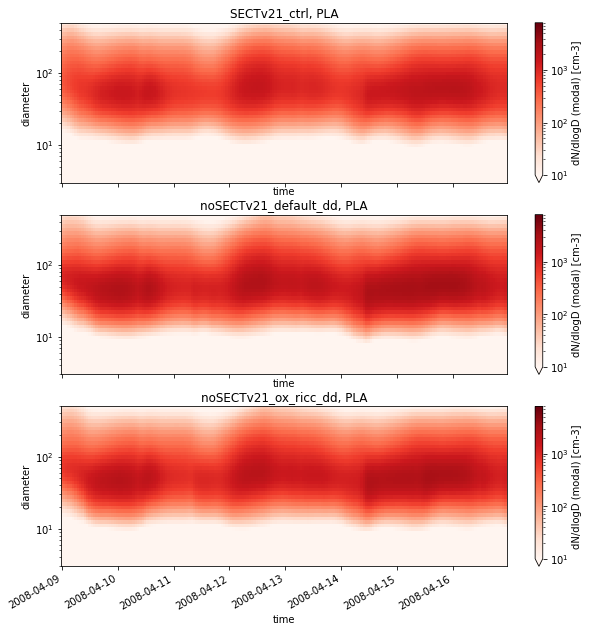

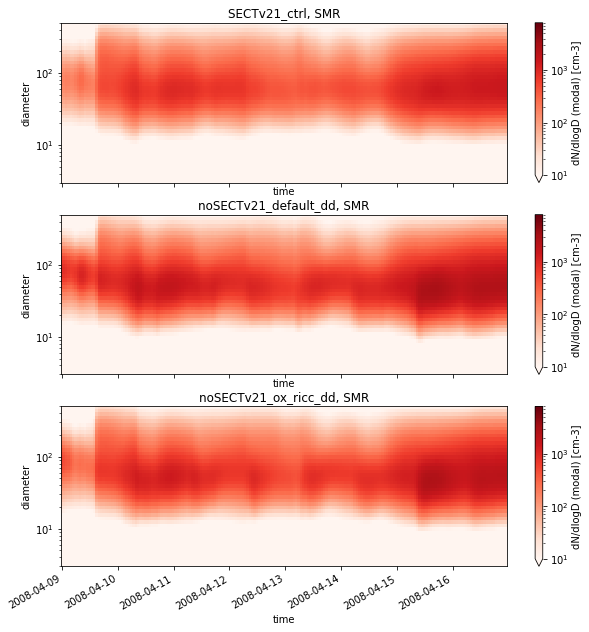

...

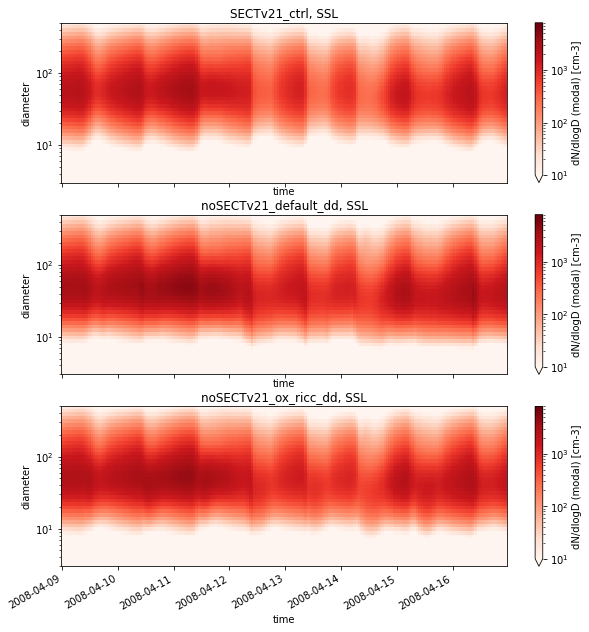

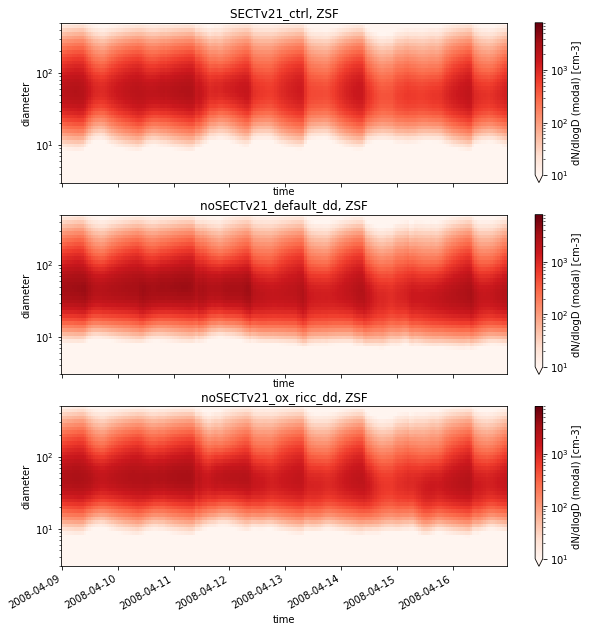

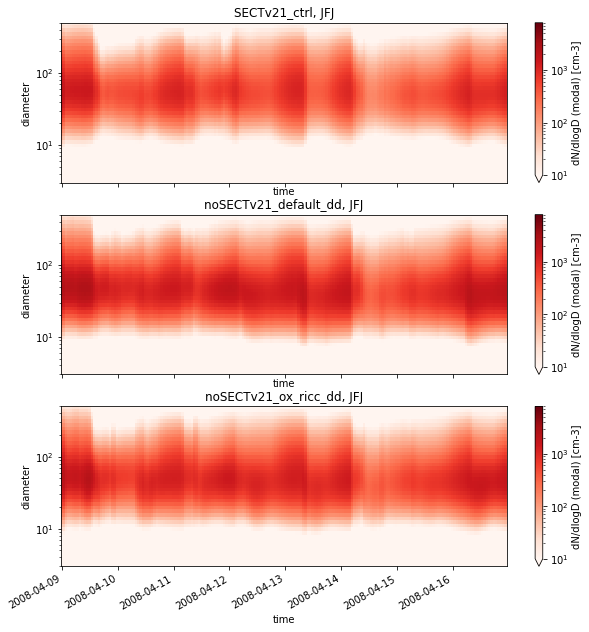

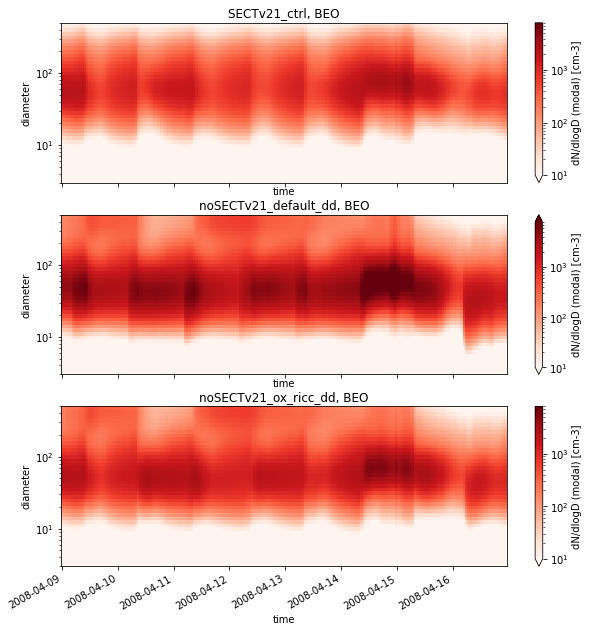

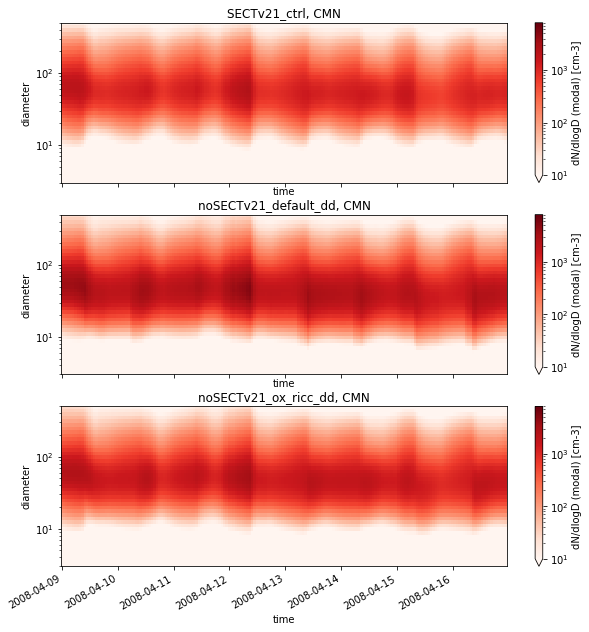

In [27]:
import matplotlib.colors as mcolors
st = '2008-04-09'
et = '2008-04-16'
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(3, figsize=[10,10], sharex=True)
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod'] #+ plt_ds['dNdlogD_sec']
        plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
        
    for case_name, ax in zip(cases_orig, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod']# + plt_ds['dNdlogD_sec']
        plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

        
    plt.show()

In [14]:
drop_coords = [c for c in plt_da.coords if c not in ['time', 'diameter']]

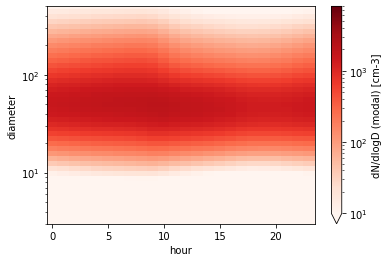

In [15]:
plt_da.drop(drop_coords).groupby('time.hour').mean().plot(x='hour',yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds')

In [28]:
from sectional_v2.util.plot.colors import get_case_col#(case)

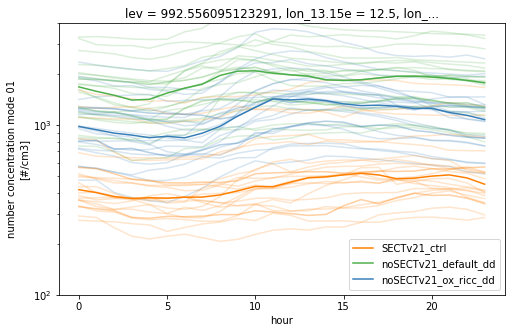

In [41]:
import matplotlib.colors as mcolors
st = '2008-03-01'
et = '2008-06-01'
cmap='viridis'
var = 'NCONC01'
fig, axs = plt.subplots(1, figsize=[8,5], sharex=True)

for i in np.arange(len(stations)):
    for case_name in cases_sec + cases_orig:
        col = get_case_col(case_name)
        ax = axs#[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds[var]# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()#.median('station')
        plt_da.plot( yscale='log', c =col, label='_nolegend_', alpha=0.2)#, linewidth=0.2)#x='hour')#, yscale='log', ylim=[3,500], , norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap=cmap, ax=ax)
        #ax.set_title(f'{case_name}, {stations[i]}')
for case_name in cases_sec + cases_orig:
    col = get_case_col(case_name)
    ax = axs#[0]
    plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
    plt_ds = plt_ds.sel(time=slice(st,et)).isel( lev=-1)
    plt_da = plt_ds[var]# + plt_ds['dNdlogD_sec']
    plt_da = plt_da.groupby('time.hour').median().median('station')
    plt_da.plot( yscale='log', c =col, label=case_name)#, alpha=0.2)#x='hour')#, yscale='log', ylim=[3,500], , norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap=cmap, ax=ax)
        #ax.set_title(f'{case_name}, {stations[i]}')

plt.ylim([100,4000])
plt.legend()
        


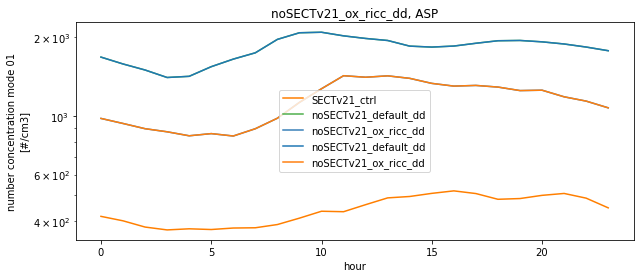

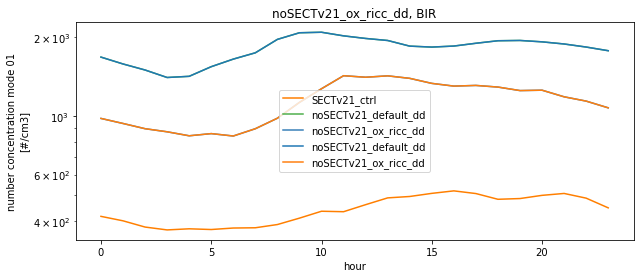

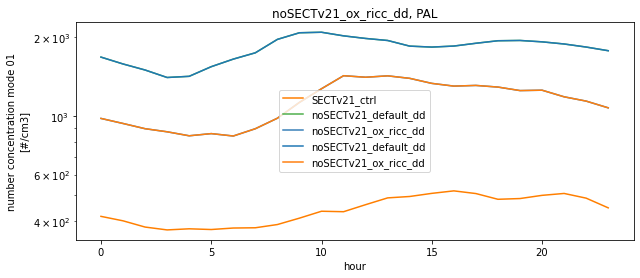

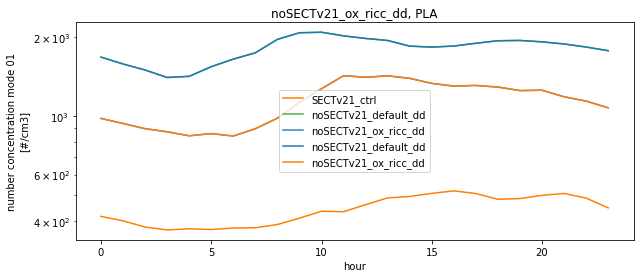

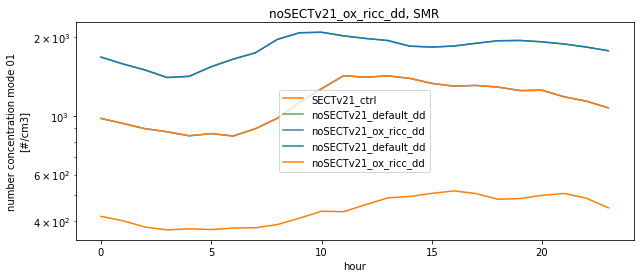

...

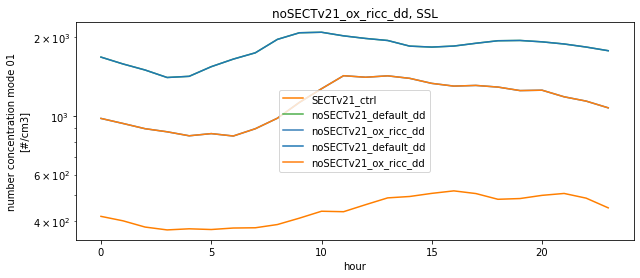

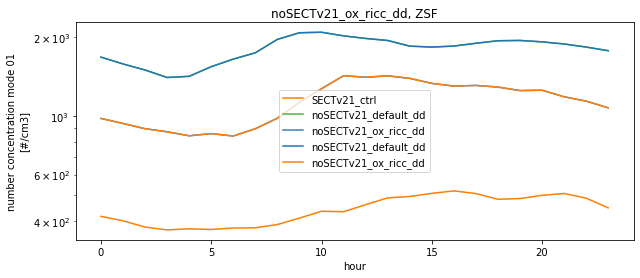

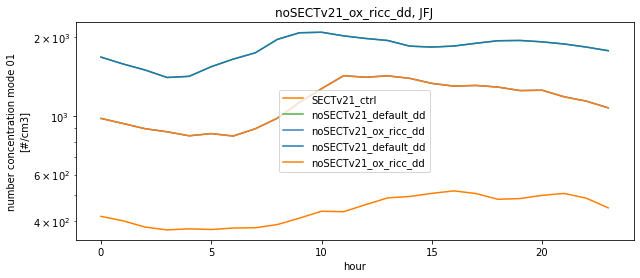

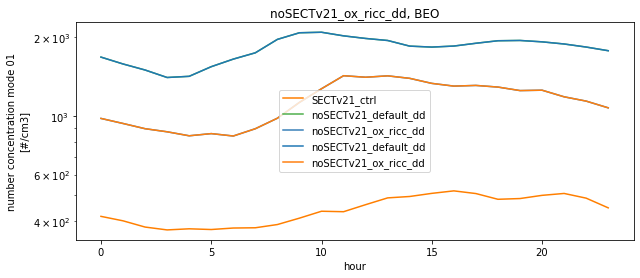

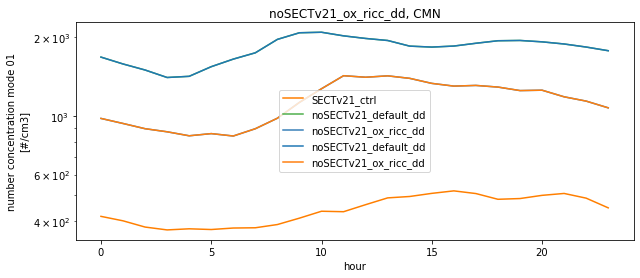

In [30]:
    for case_name in cases_orig:#, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel( lev=-1)
        plt_da = plt_ds[var]# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median().median('station')
        
        plt_da.plot(label=case_name, yscale='log')#x='hour', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap=cmap, ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

    plt.legend()
    plt.show()

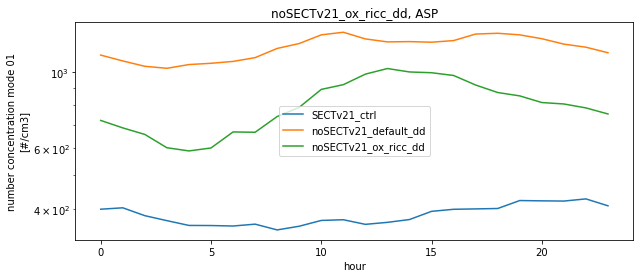

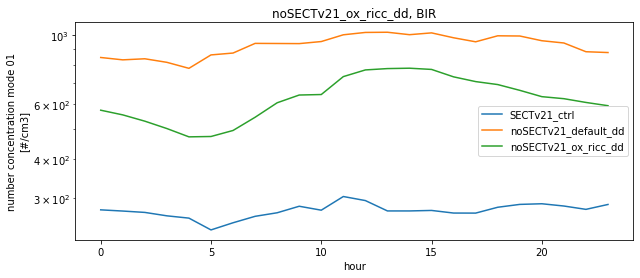

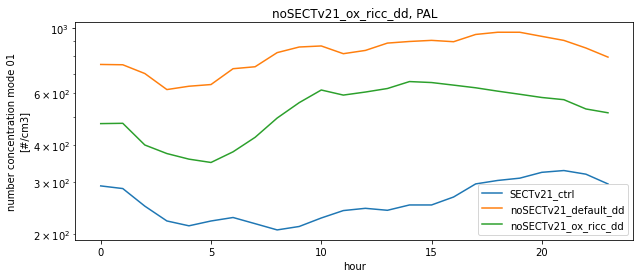

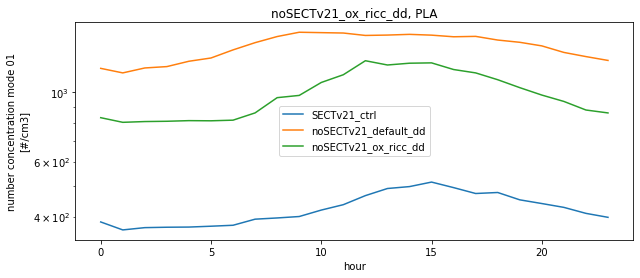

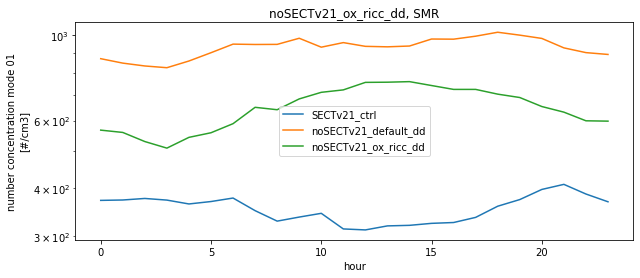

...

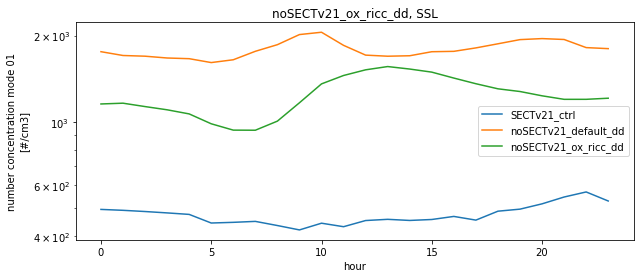

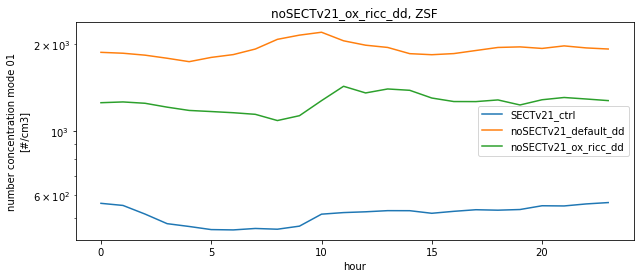

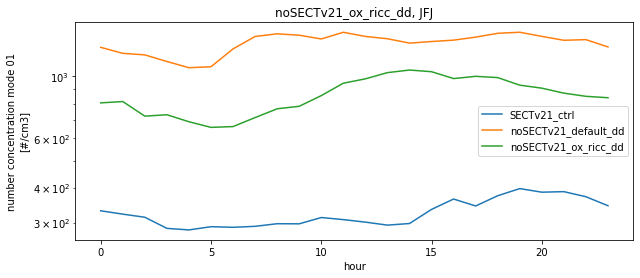

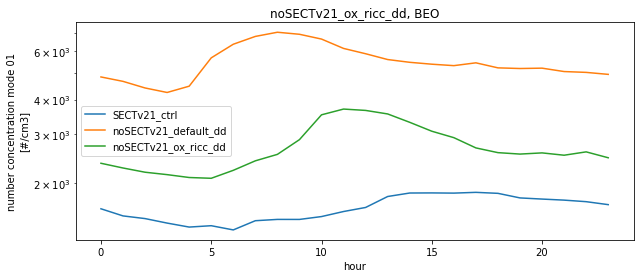

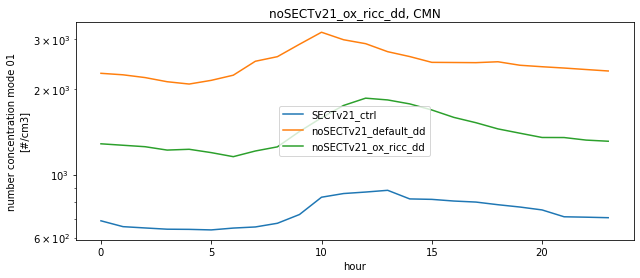

In [82]:
import matplotlib.colors as mcolors
st = '2008-03-01'
et = '2008-06-01'
cmap='viridis'
var = 'NCONC01'
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(1, figsize=[10,4], sharex=True)
    axs=[axs]
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds[var]# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        plt_da.plot(label=case_name, yscale='log')#x='hour')#, yscale='log', ylim=[3,500], , norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap=cmap, ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
        
    for case_name in cases_orig:#, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds[var]# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        
        plt_da.plot(label=case_name, yscale='log')#x='hour', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap=cmap, ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

    plt.legend()
    plt.show()

In [20]:
plt_ds['dNdlogD_mode01']

<xarray.DataArray 'dNdlogD_mode01' (time: 2232, diameter: 61)>
[136152 values with dtype=float64]
Coordinates:
    lev         float64 992.6
    station     <U3 'OBK'
  * time        (time) datetime64[ns] 2008-03-01 ... 2008-06-01T23:00:00
  * diameter    (diameter) float64 1.0 1.1 1.3 1.4 ... 708.0 794.3 891.2 1e+03
    lat_46.53n  float64 46.42
    lat_52.52n  float64 52.11
    lat_53.32n  float64 54.0
    lon_7.92e   float64 7.5
    lon_23.58e  float64 22.5
    lat_35.33n  float64 35.05
    lon_2.95e   float64 2.5
    lon_4.92e   float64 5.0
    lat_56.02n  float64 55.89
    lon_10.77e  float64 10.0
    lat_44.18n  float64 44.53
    lon_24.28e  float64 25.0
    lon_7.98e   float64 7.5
    lon_9.88e   float64 10.0
    lat_42.17n  float64 42.63
    lat_46.97n  float64 46.42
    lat_51.30n  float64 52.11
    lat_51.57n  float64 52.11
    lon_8.63e   float64 7.5
    lat_58.38n  float64 57.79
    lon_10.68e  float64 10.0
    lon_19.55e  float64 20.0
    lat_51.53n  float64 52.11
    lon_11.90e  float64 12.5
    lon_15.08e  float64 15.0
    lon_12.90e  float64 12.5
    lat_45.82n  float64 46.42
    lon_8.25e   float64 7.5
    lon_1.32e   float64 2.5
    lon_25.67e  float64 25.0
    lat_55.92n  float64 55.89
    lat_47.80n  float64 48.32
    lat_67.97n  float64 67.26
    lat_47.92n  float64 48.32
    lat_61.85n  float64 61.58
    lon_17.38e  float64 17.5
    lon_10.98e  float64 10.0
    lon_24.12e  float64 25.0
    lat_58.80n  float64 59.68
    lat_53.00n  float64 52.11
    lon_21.00e  float64 20.0
    lon_13.15e  float64 12.5
    lat_47.42n  float64 48.32
    lat_45.77n  float64 46.42
    lat_49.58n  float64 50.21
    lon_11.00e  float64 10.0
    lat_78.92n  float64 78.63
    lon_7.95e   float64 7.5
    orig_names  object 'NMR01_15.08e_49.58n'
Attributes:
    units:      cm-3
    long_name:  dN/dlogD (mode01)

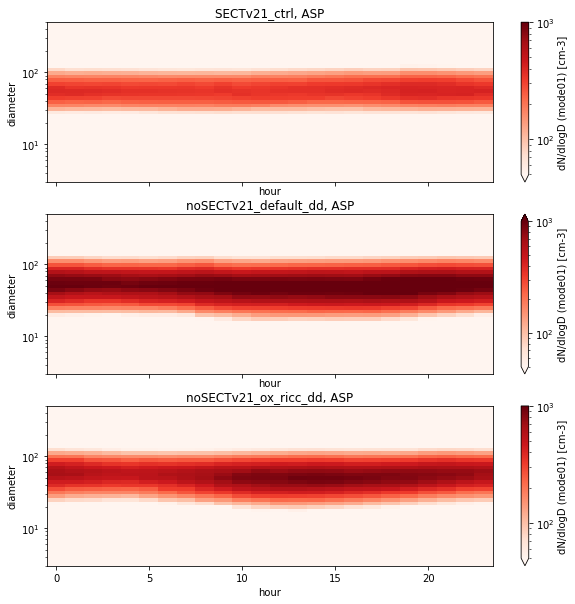

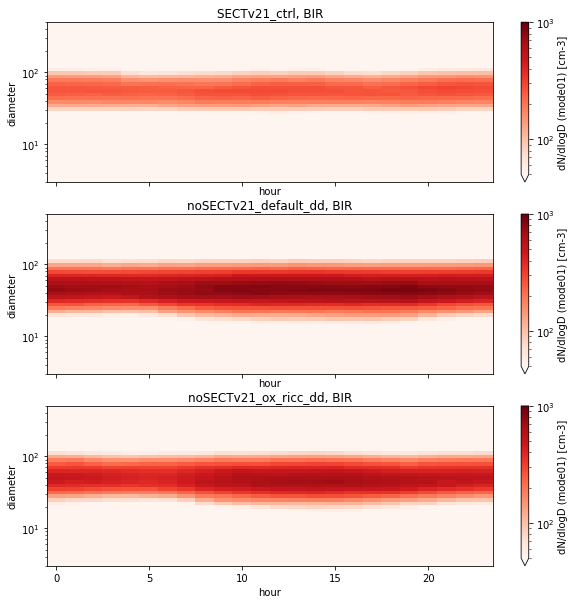

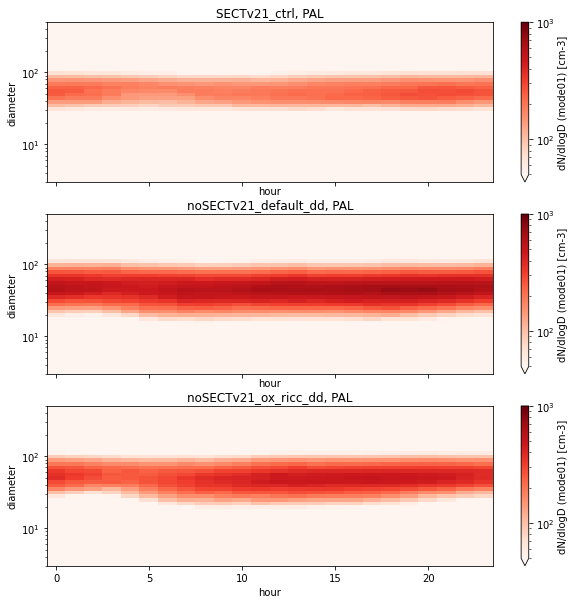

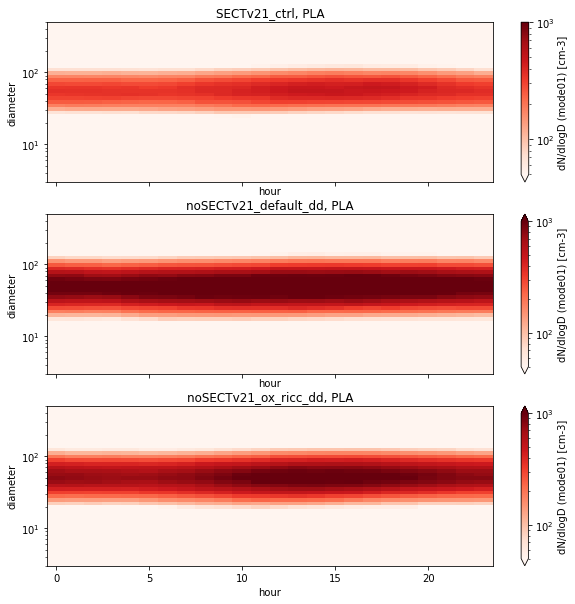

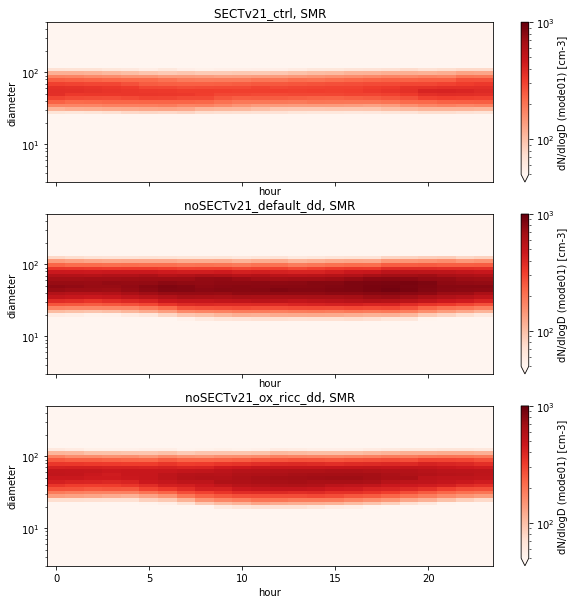

...

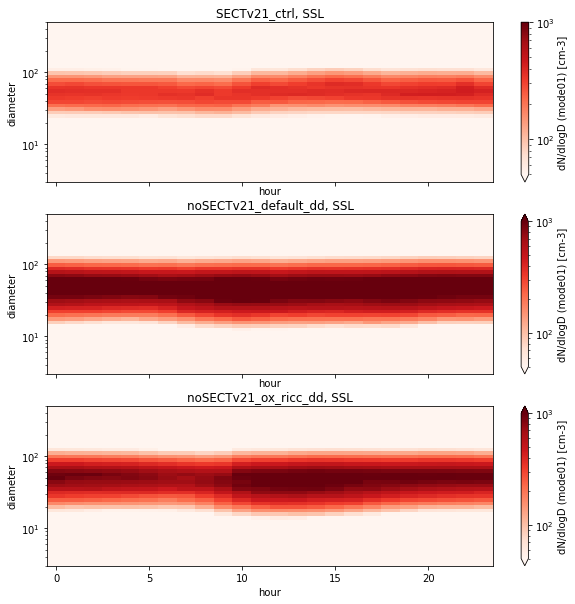

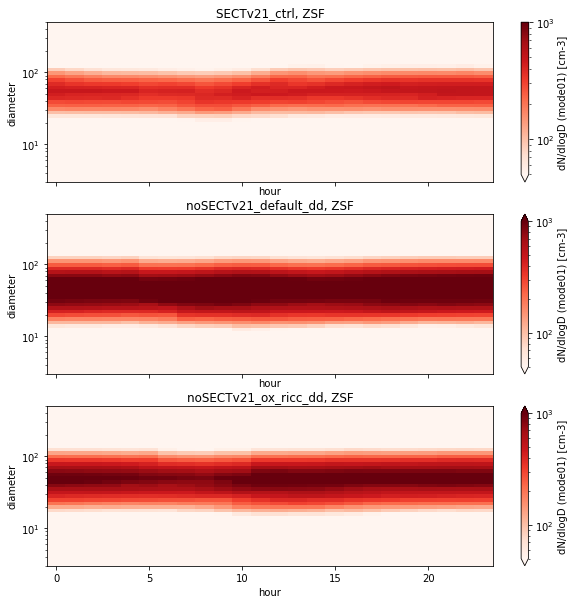

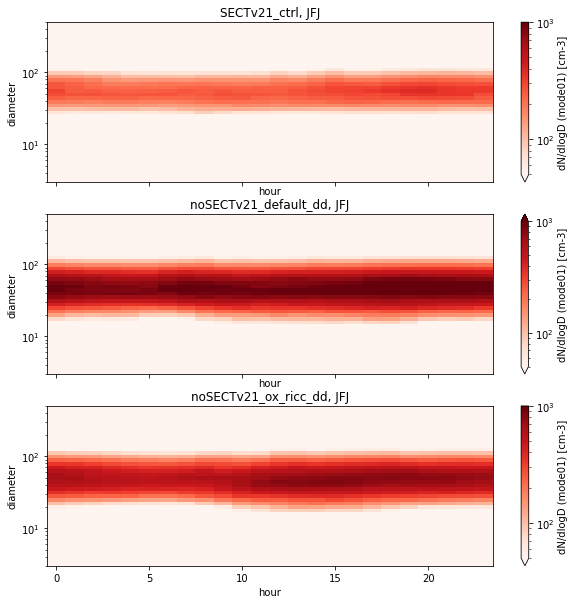

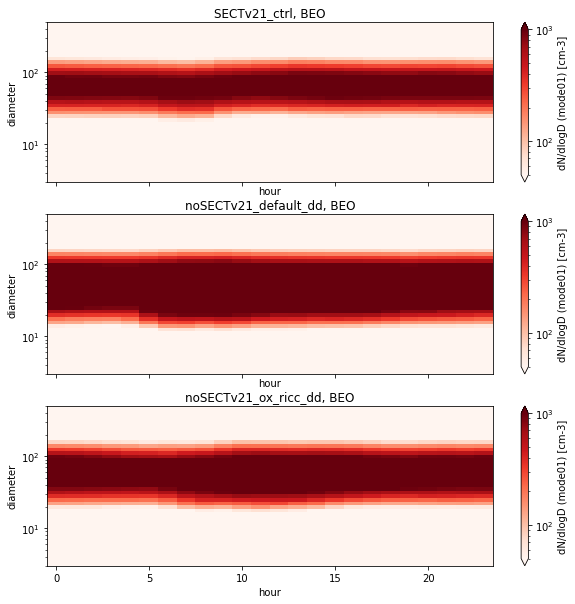

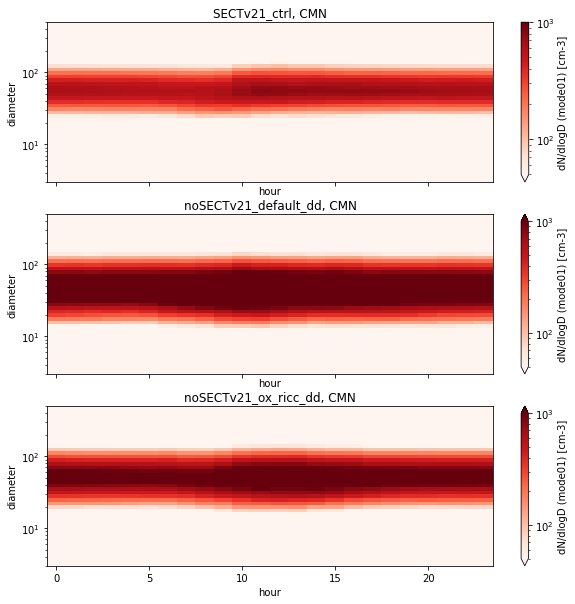

In [23]:
import matplotlib.colors as mcolors
st = '2008-03-01'
et = '2008-06-01'
cmap='Reds'
norm = mcolors.LogNorm(vmin=50,vmax=2e3)
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(3, figsize=[10,10], sharex=True)
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mode01']# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=norm
                    , cmap=cmap, ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
        
    for case_name, ax in zip(cases_orig, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mode01']# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=norm, cmap=cmap, ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

        
    plt.show()

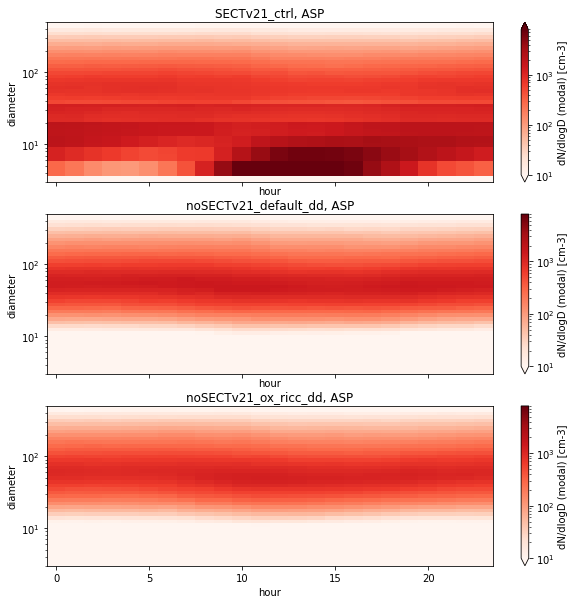

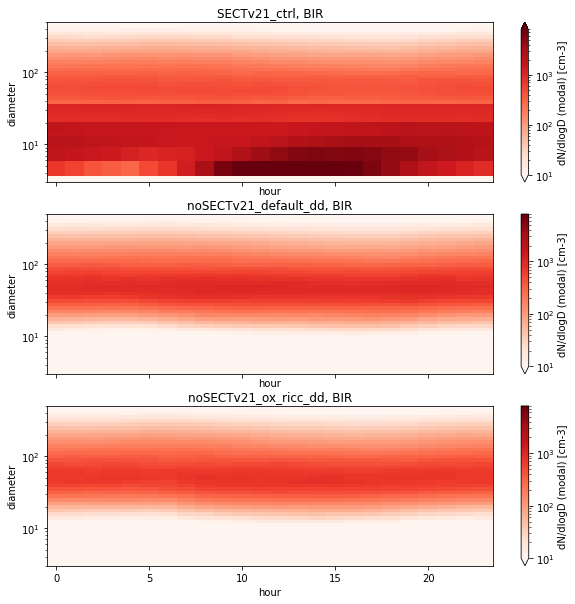

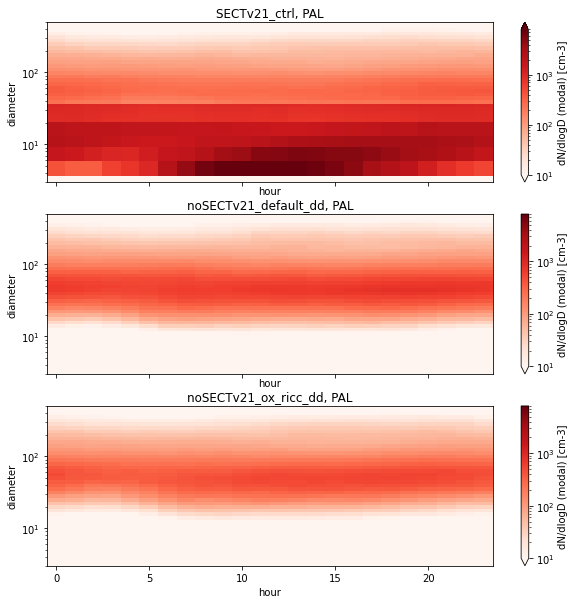

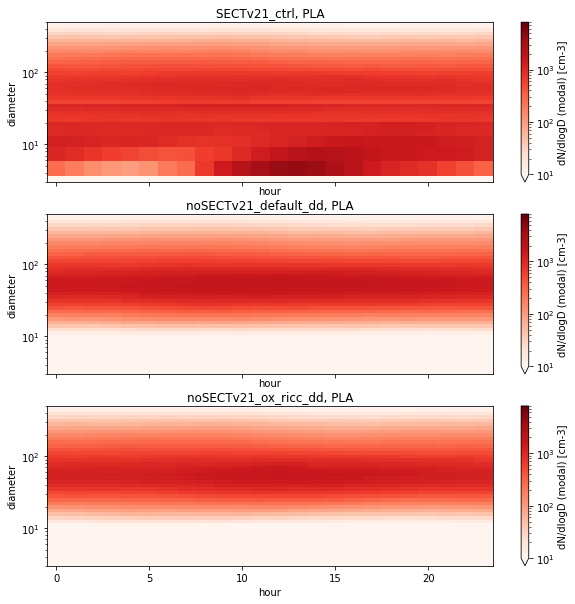

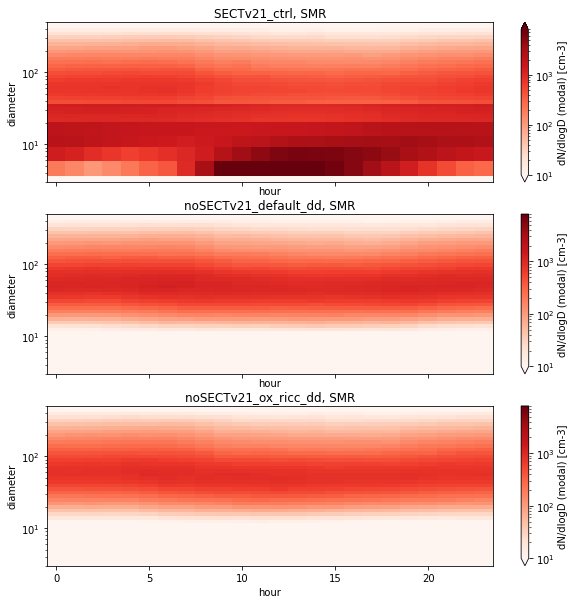

...

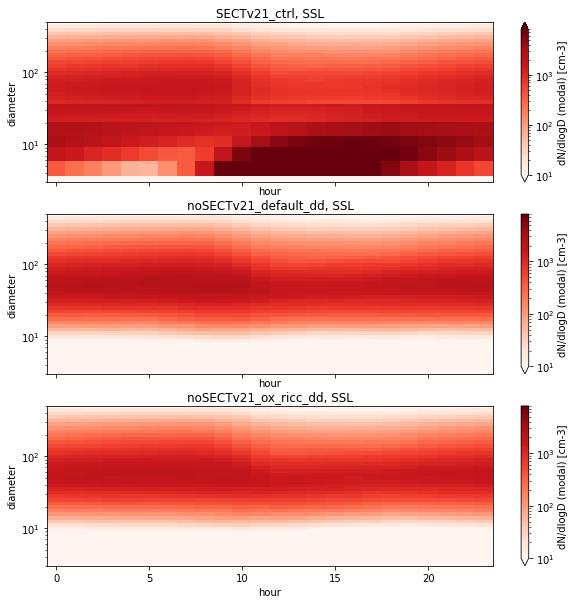

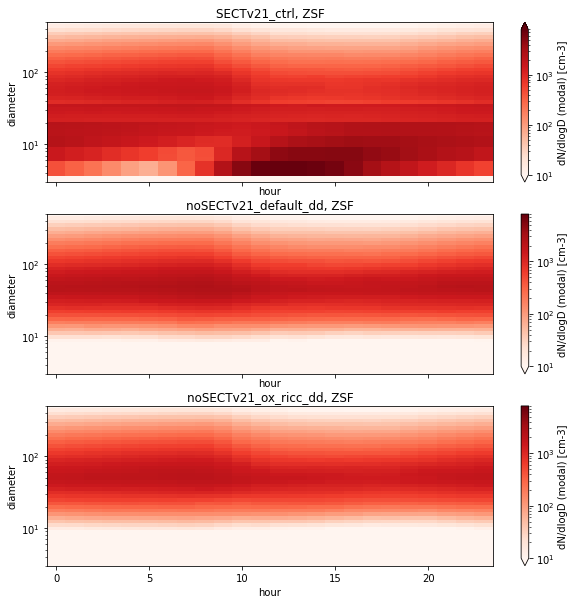

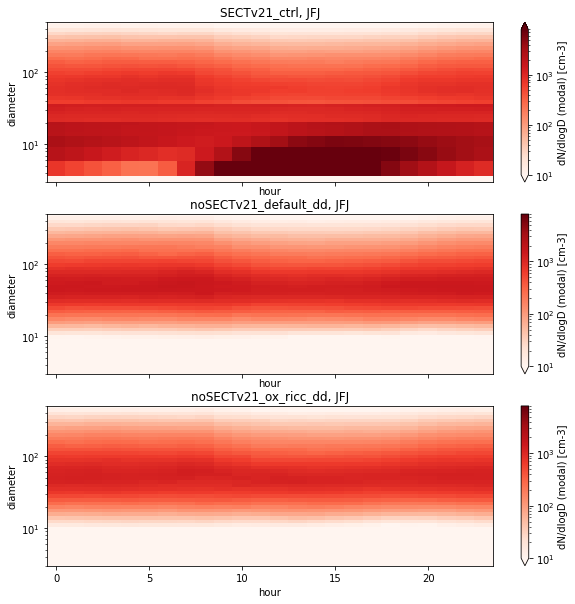

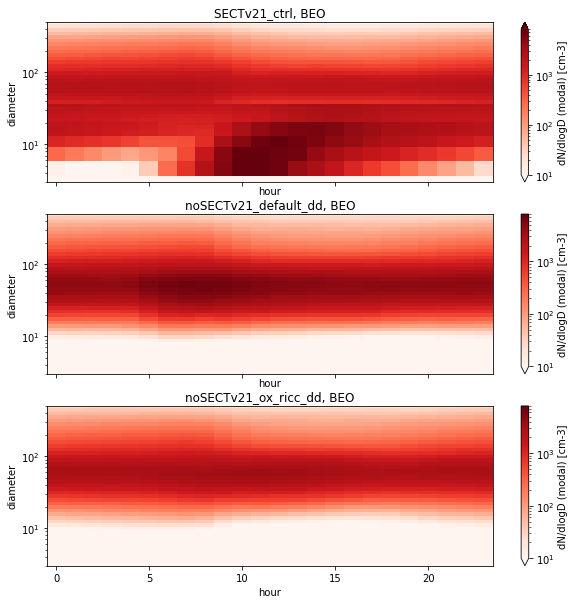

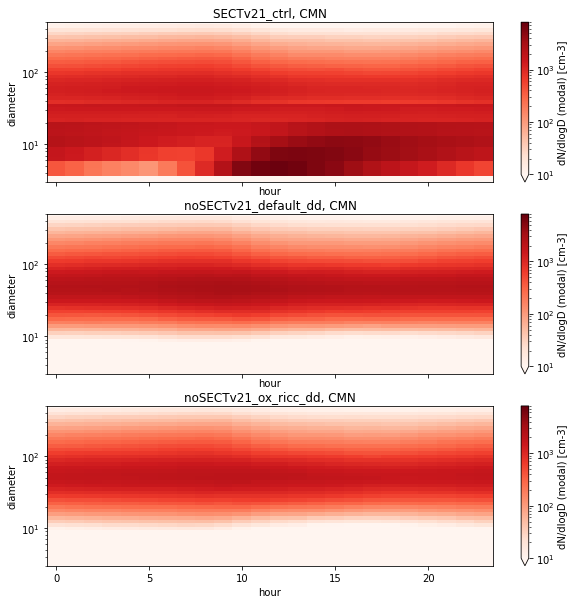

In [68]:
import matplotlib.colors as mcolors
st = '2008-03-01'
et = '2008-06-01'
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(3, figsize=[10,10], sharex=True)
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod'] + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
        
    for case_name, ax in zip(cases_orig, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-1)
        plt_da = plt_ds['dNdlogD_mod']# + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

        
    plt.show()

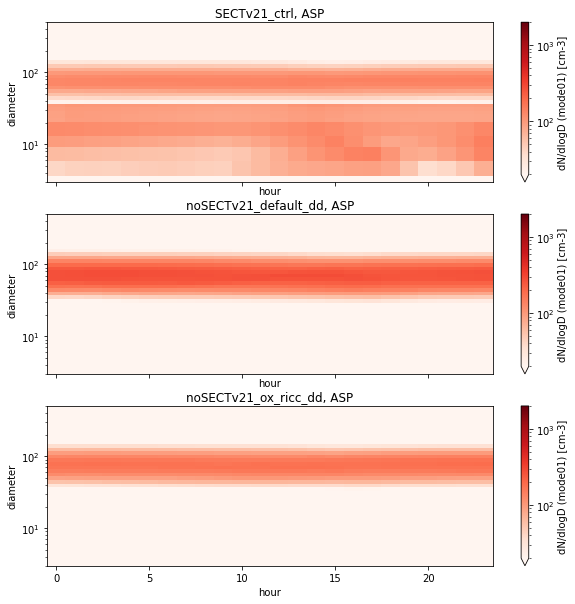

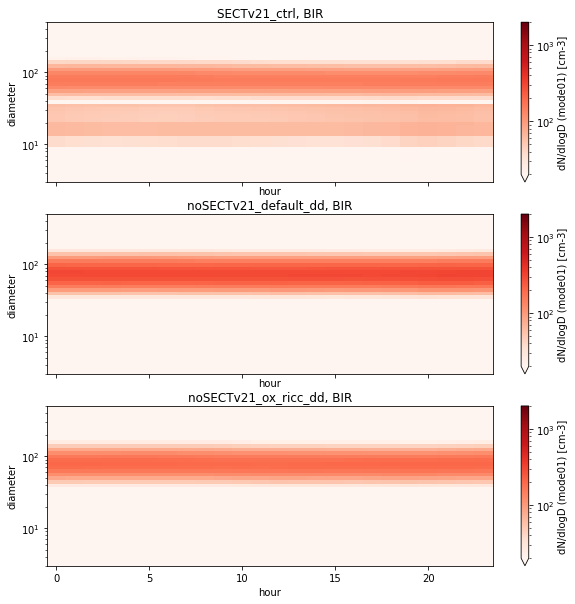

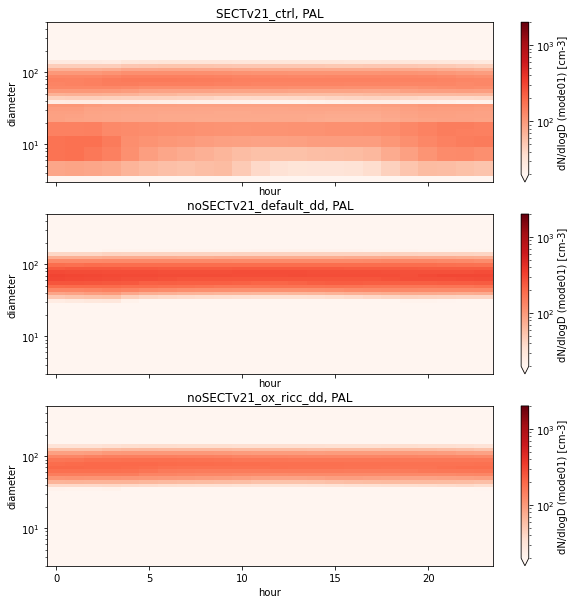

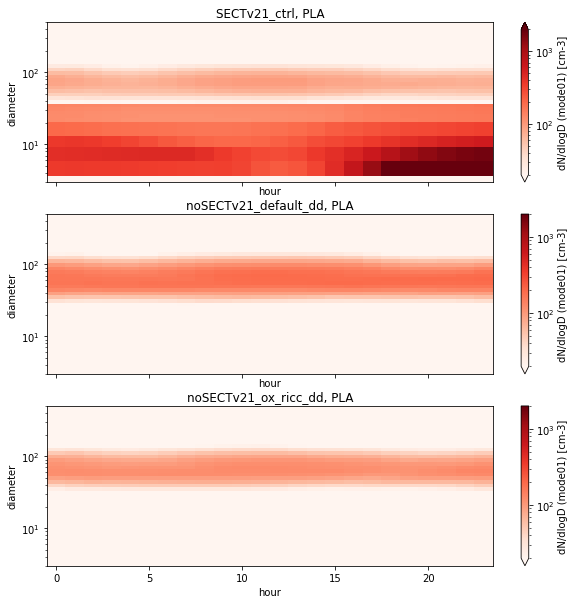

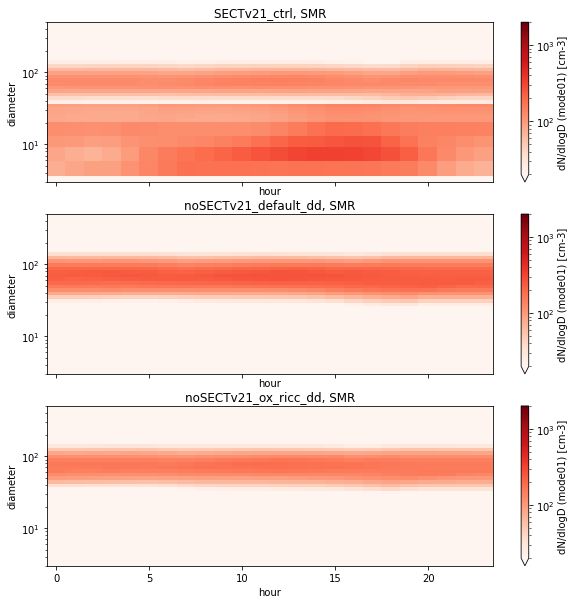

...

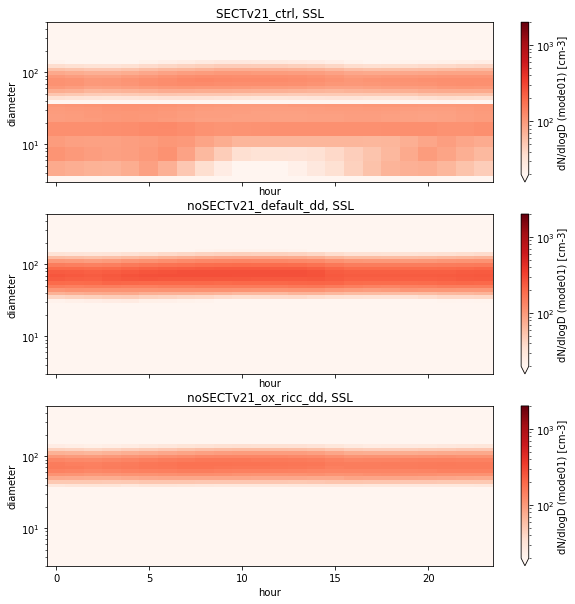

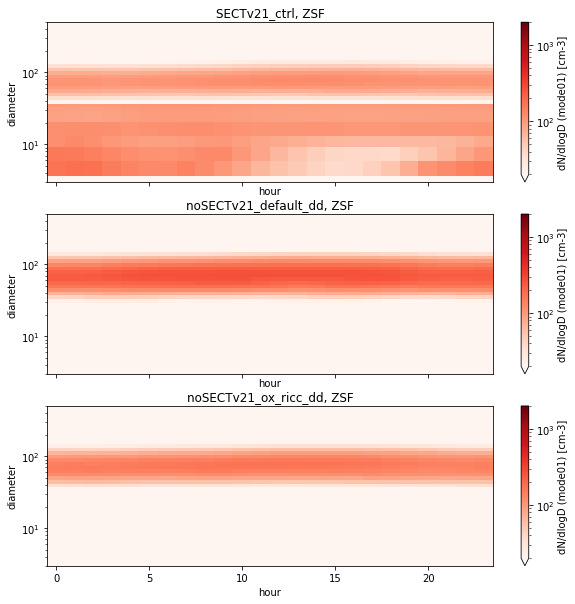

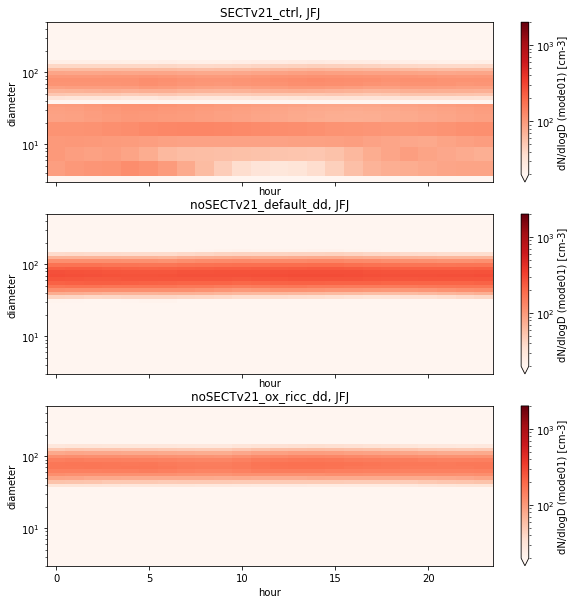

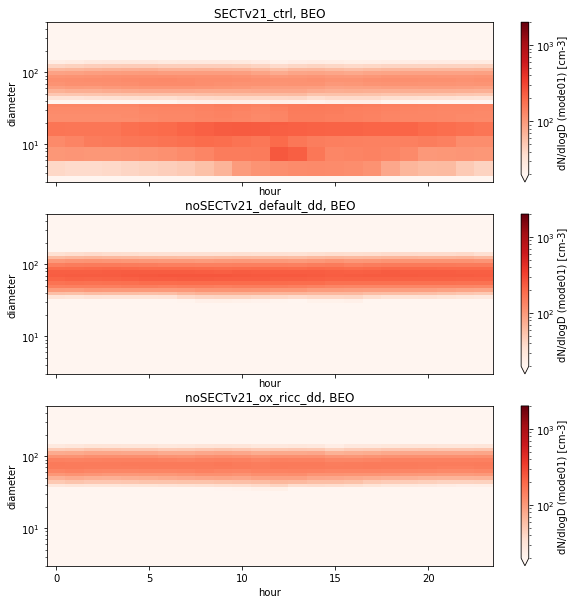

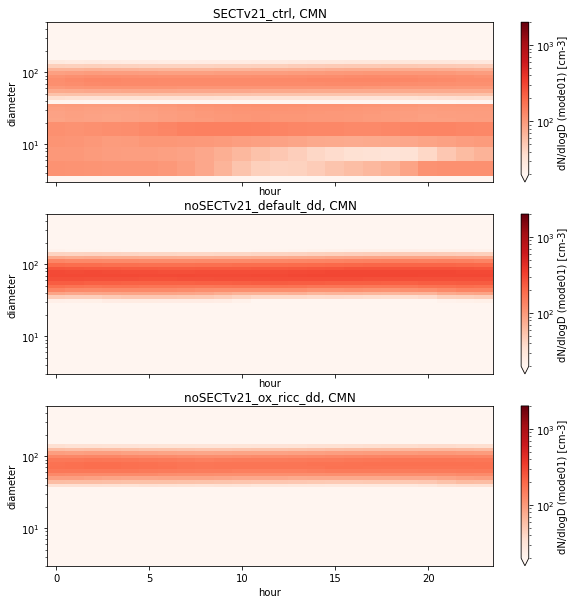

In [66]:
import matplotlib.colors as mcolors
st = '2008-04-09'
et = '2008-04-16'
norm = mcolors.LogNorm(vmin=20,vmax=2e3)
for i in np.arange(len(stations)):
    fig, axs = plt.subplots(3, figsize=[10,10], sharex=True)
    for case_name in cases_sec:
        ax = axs[0]
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-15)
        plt_da = plt_ds['dNdlogD_mode01'] + plt_ds['dNdlogD_sec']
        plt_da = plt_da.groupby('time.hour').median()
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=norm, cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
        
    for case_name, ax in zip(cases_orig, axs[1:]):
        plt_ds = dic_sd[case_name]
                  #['dNdlogD_mod']+dic_sd[case_name]['dNdlogD_sec'])
        plt_ds = plt_ds.sel(time=slice(st,et)).isel(station=i, lev=-15)
        plt_da = plt_ds['dNdlogD_mode01']# + plt_ds['dNdlogD_sec']
        
        plt_da = plt_da.groupby('time.hour').median()
        
        plt_da.plot(x='hour', yscale='log', ylim=[3,500], label=case_name, norm=norm, cmap='Reds', ax=ax)
        ax.set_title(f'{case_name}, {stations[i]}')
    #    plt_da = (dic_sd[case_name]['dNdlogD_mod'])
    #    plt_da = plt_da.sel(time=slice(st,et)).isel(station=i, lev=-1)
    #    
    #    plt_da.plot(x='time', yscale='log', ylim=[3,500], label=case_name, norm=mcolors.LogNorm(vmin=10,vmax=8e3), cmap='Reds', ax=ax)
    #    ax.set_title(case_name)

        
    plt.show()